In [2]:
from a72_utilities import *
from skimage.io import imread
import os
import matplotlib.pyplot as plt
from tifffile import imsave
import matplotlib
matplotlib.rcParams['figure.dpi'] = 200 #Set the figure resolution to 200 dpi 
plt.rcParams.update({'font.size': 16})  # Set the default font size to 16
plt.rcParams['font.family'] = 'Helvetica' #Set the default font to helvetica
from matplotlib.ticker import AutoMinorLocator

In [3]:
element_colors = {"Al":(46/256,37/256,133/256),"Cr":(51/256,117/256,56/256),"Fe":(93/256,168/256,153/256),"Mn":(148/256,203/256,236/256),"Mo":(220/256,205/256,12/256),"Ni":(194/256,106/256,119/256),"Ti":(159/256,74/256,150/256)}

In [4]:
# dir = '/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Raw data/Depth profile stacks'
# depth_profiles = {}
# for filename in os.listdir(dir):
#     element = filename[:2]
#     data = imread(os.path.join(dir, filename))
#     depth_profiles[element] = data
# print(data.shape)

In [5]:
dir = '/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Raw data/Depth profile ascii'
depth_profiles = {}
for filename in os.listdir(dir):
    element = filename[-7:-5]
    print(element)
    data = read_image_from_textfile(os.path.join(dir, filename),datacolumn = 3,nskip=9)
    data = data.reshape((int(len(data)/(512*512)),512,512))
    depth_profiles[element] = data
    
print(data.shape)

Mn
Ti
Fe
Al
Ni
Cr
(41, 512, 512)


dict_keys(['Mn', 'Ti', 'Fe', 'Al', 'Ni', 'Cr'])


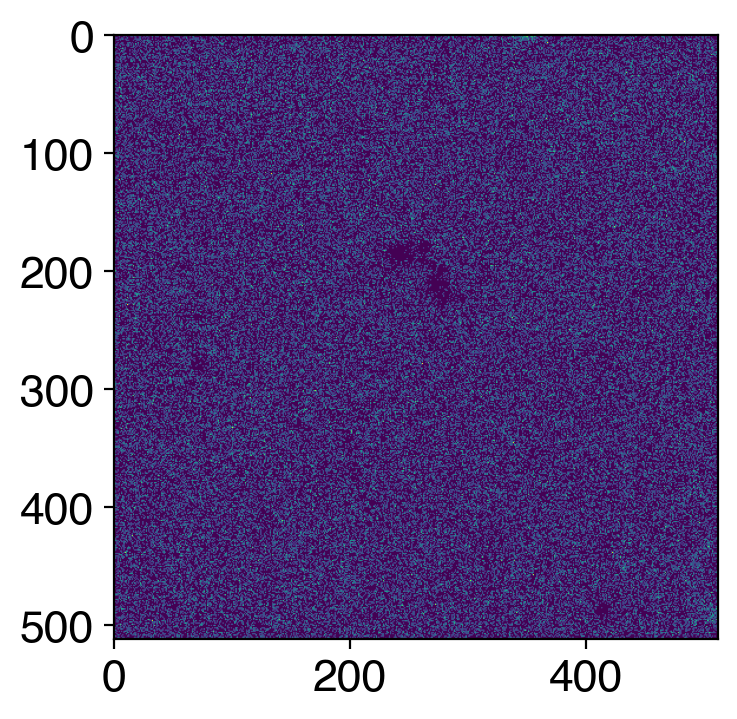

In [6]:
print(depth_profiles.keys())
plt.imshow(depth_profiles["Ni"][1,:,:])

Text(0, 0.5, 'Total counts')

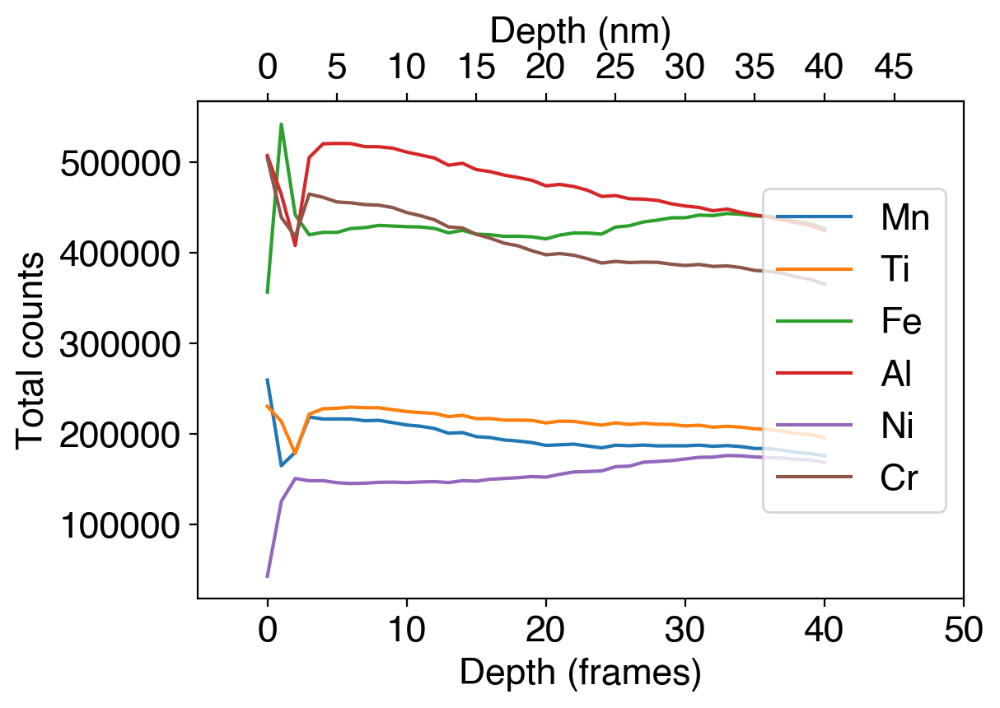

In [7]:
legend = []
fig,axs = plt.subplots()
for element in depth_profiles:
    axs.plot(np.sum(depth_profiles[element],axis=(1,2)))
    legend.append(element)

axs2 = axs.secondary_xaxis('top')
axs2.set_xticks(np.arange(0,46,5))
axs2.set_xlabel("Depth (nm)")
plt.legend(legend, loc='right')
plt.xlim((-5,50))
plt.xlabel("Depth (frames)")
plt.ylabel('Total counts')

dict_keys(['pc_1_mask', 'pc_21_mask', 'l21_mask', 'fcc_mask'])


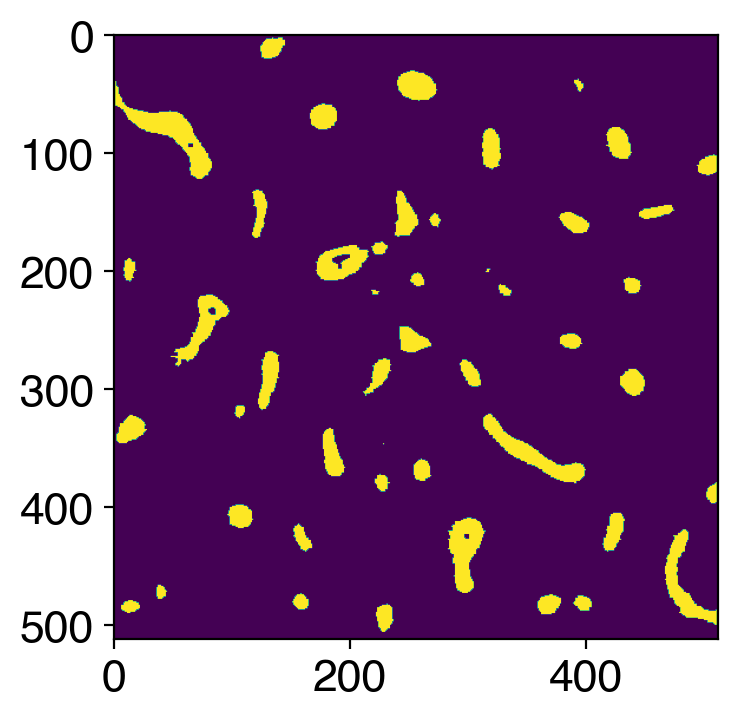

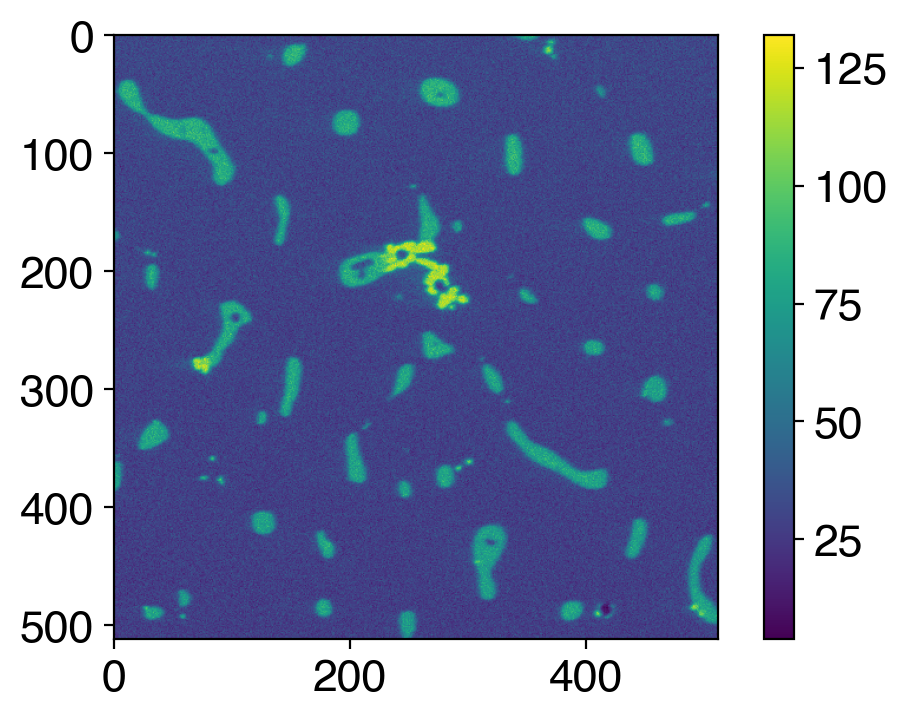

In [8]:
mask_dir = '/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Masks/Registered masks'
masks = {}
for filename in os.listdir(mask_dir):
    phase = filename[:-4]
    data = imread(os.path.join(mask_dir, filename))
    masks[phase] = data

print(masks.keys())

l21_mask = imread("/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Masks/Positive polarity/l21 from Al+.tif")
pca_l21_mask = imread("/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Masks/Registered masks/l21_mask.tif")
plt.imshow(l21_mask)
plt.show()
plt.imshow(np.sum(depth_profiles['Ti'],axis=0))
plt.colorbar()
#imsave('/Users/apple/Sync/Research/Alloy 72/A72 Tof SIMS/Raw data/Ti depth profile/Ti_sum.tif',np.sum(depth_profiles['Ti'],axis=0).astype(np.uint16))

pc_1_mask


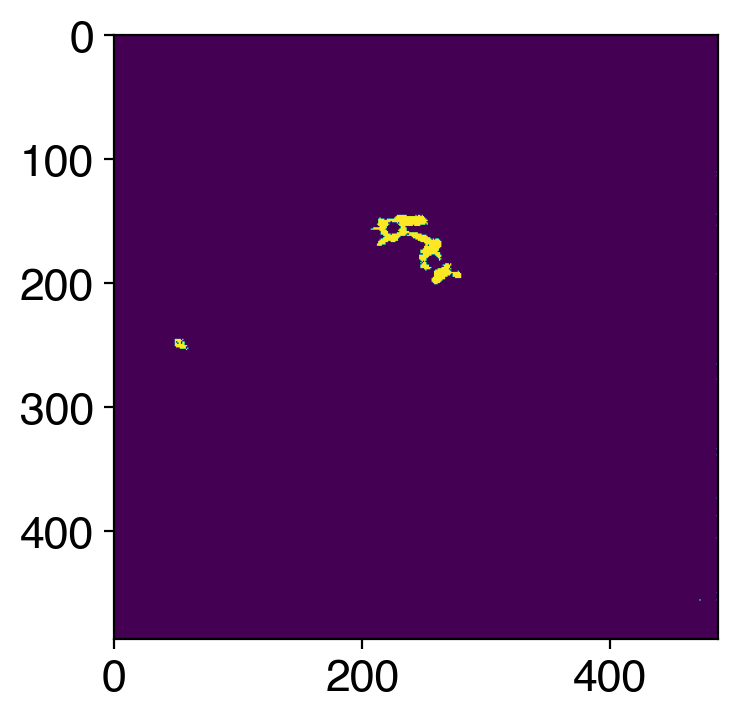

pc_21_mask


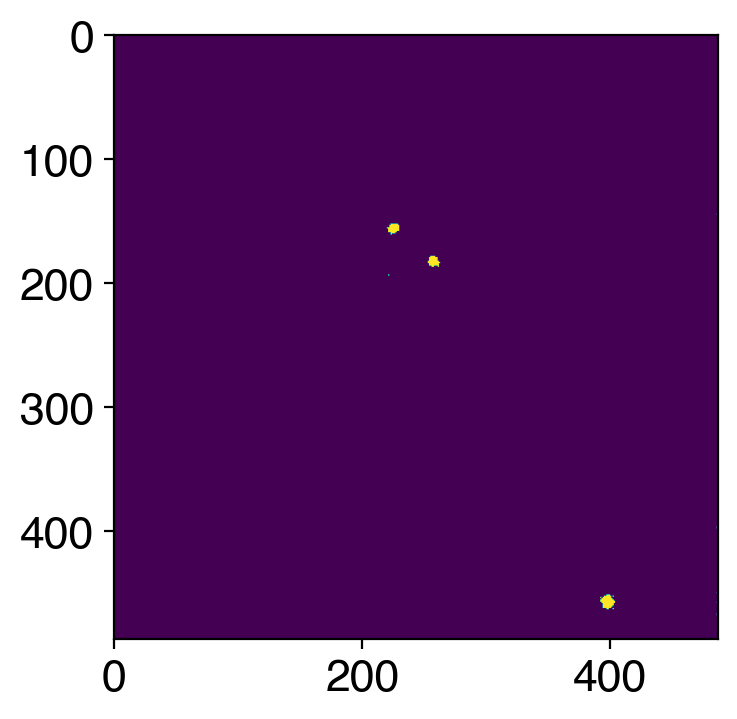

l21_mask


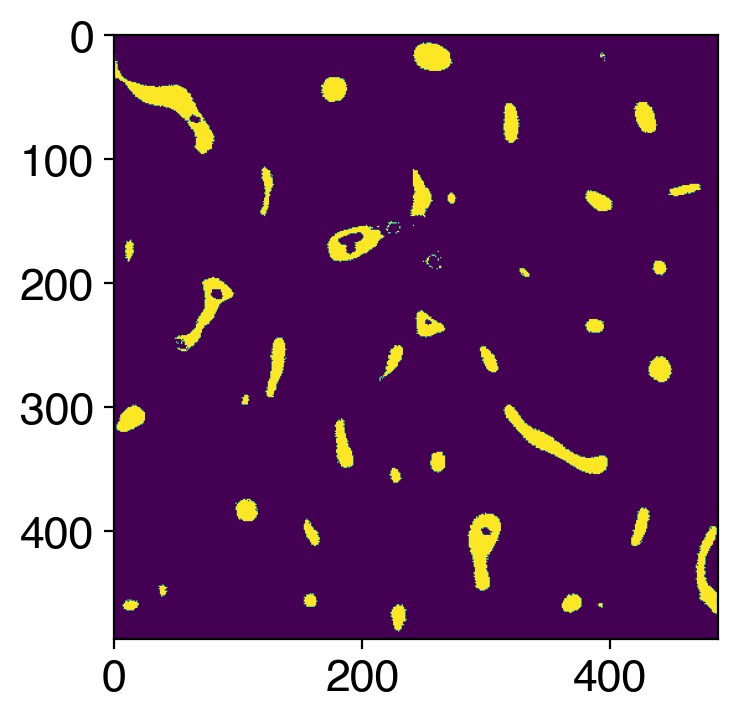

fcc_mask


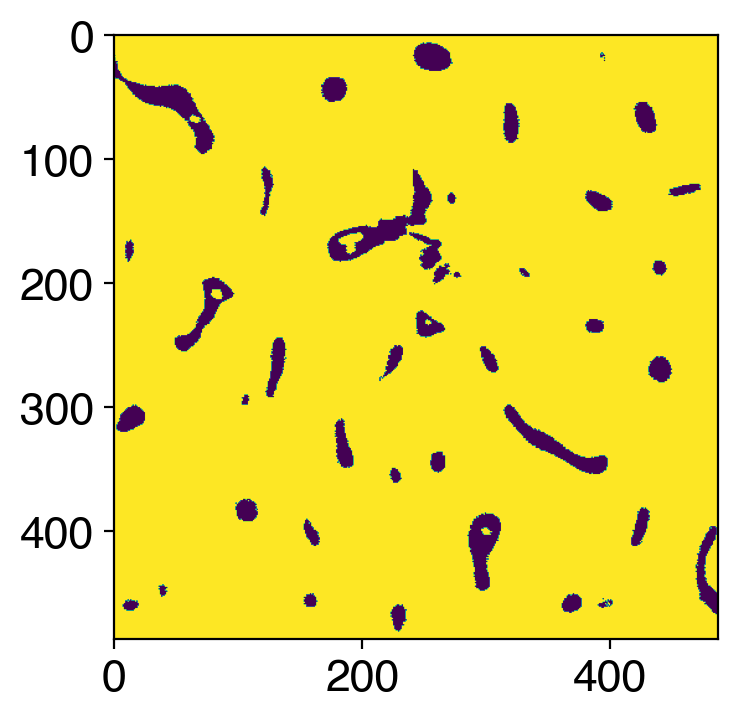

In [9]:
for (i,element) in enumerate(masks):
    print(element)
    plt.imshow(masks[element])
    plt.show()

[ -5. -19.]


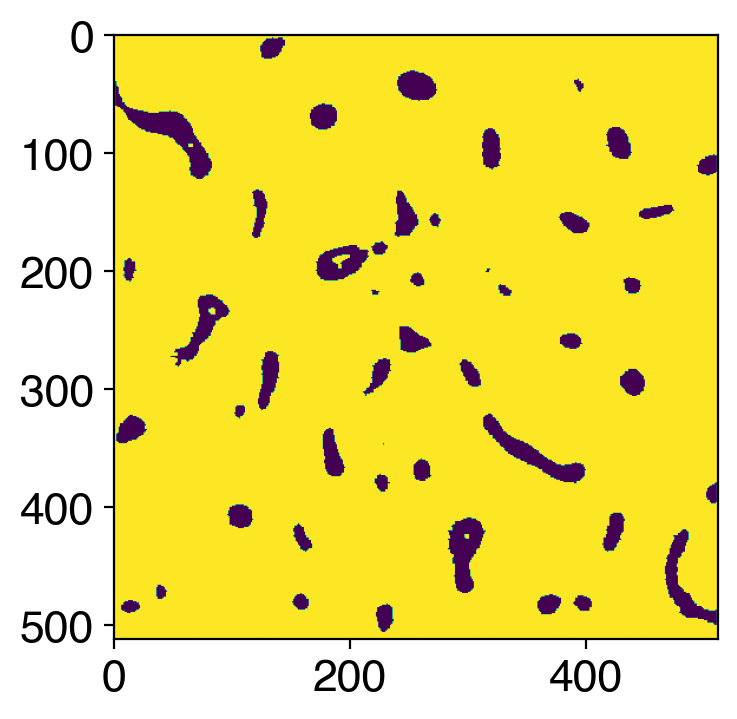

In [10]:
shifted_depth_profile = find_shift_2d(l21_mask, normalize_array(np.sum(depth_profiles['Ti'],axis=0)))

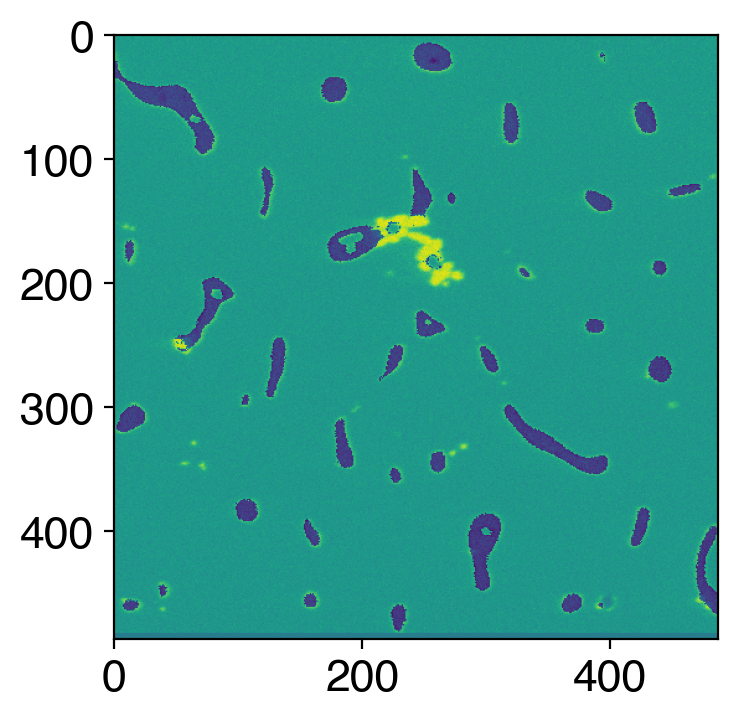

In [11]:
plt.imshow(shifted_depth_profile[25:,:-25]-pca_l21_mask)

(41, 487, 487)


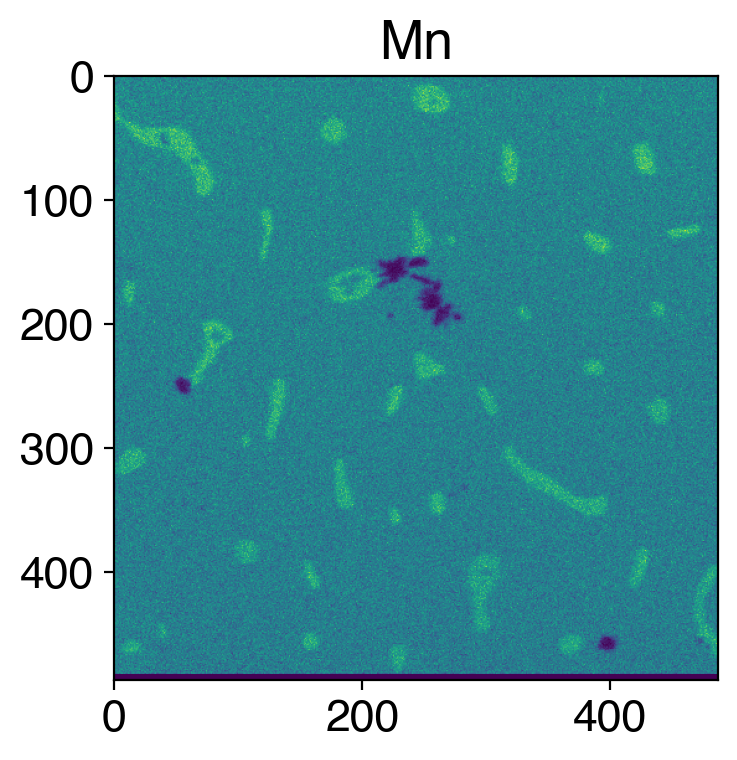

(41, 487, 487)


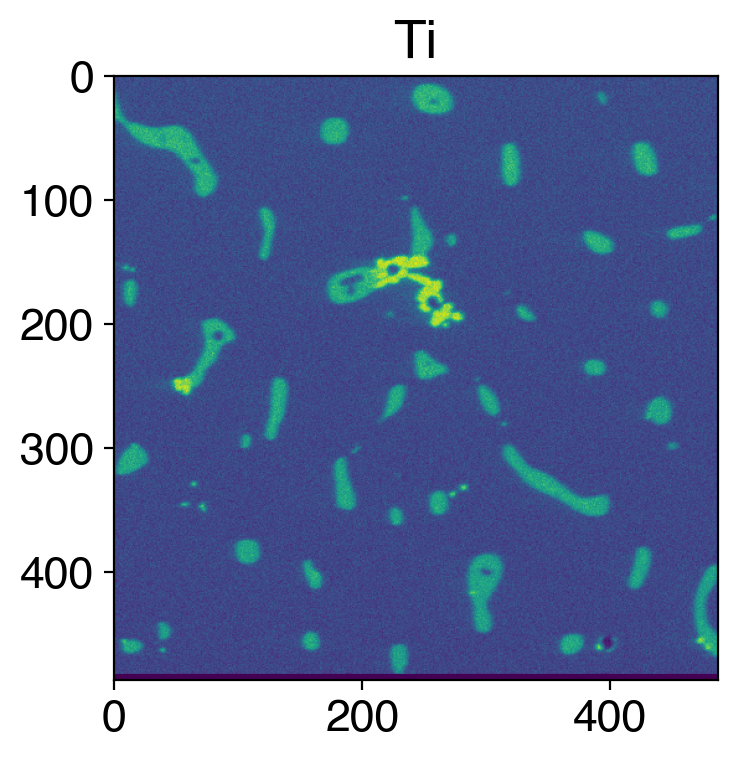

(41, 487, 487)


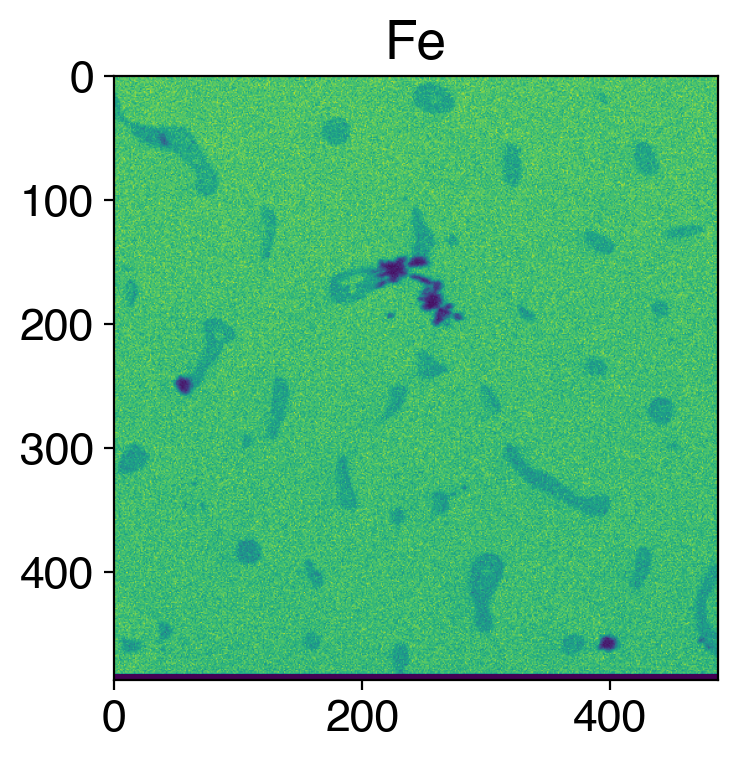

(41, 487, 487)


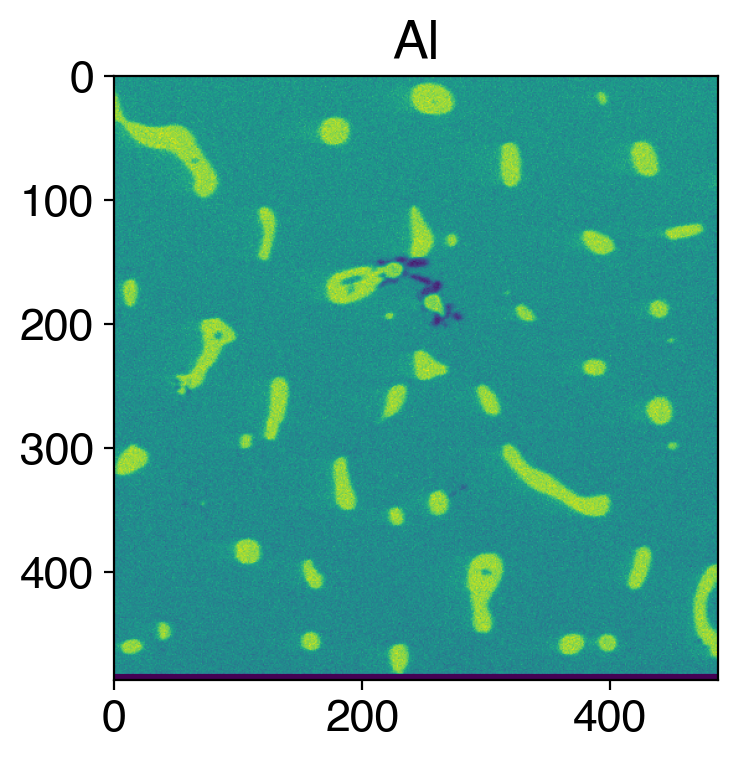

(41, 487, 487)


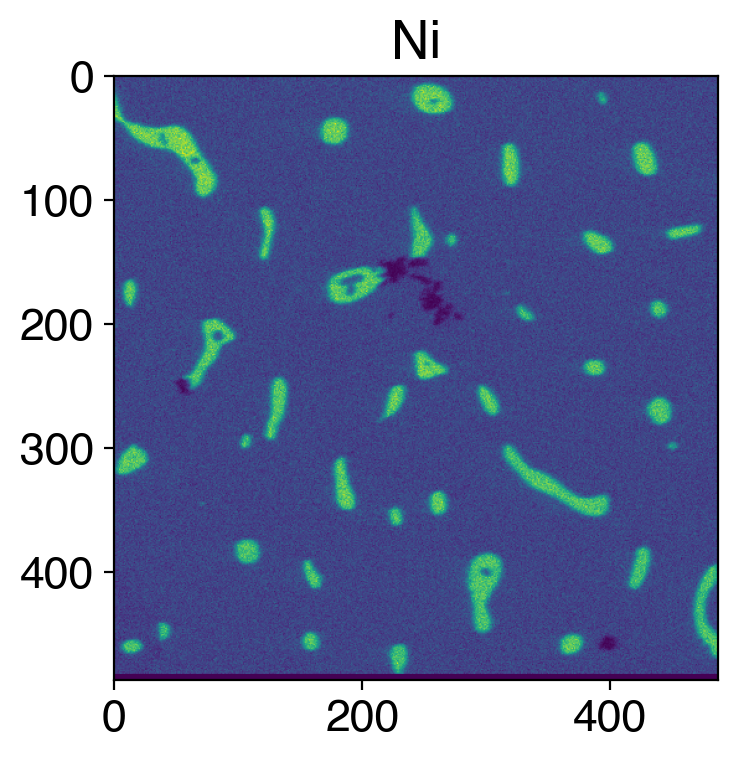

(41, 487, 487)


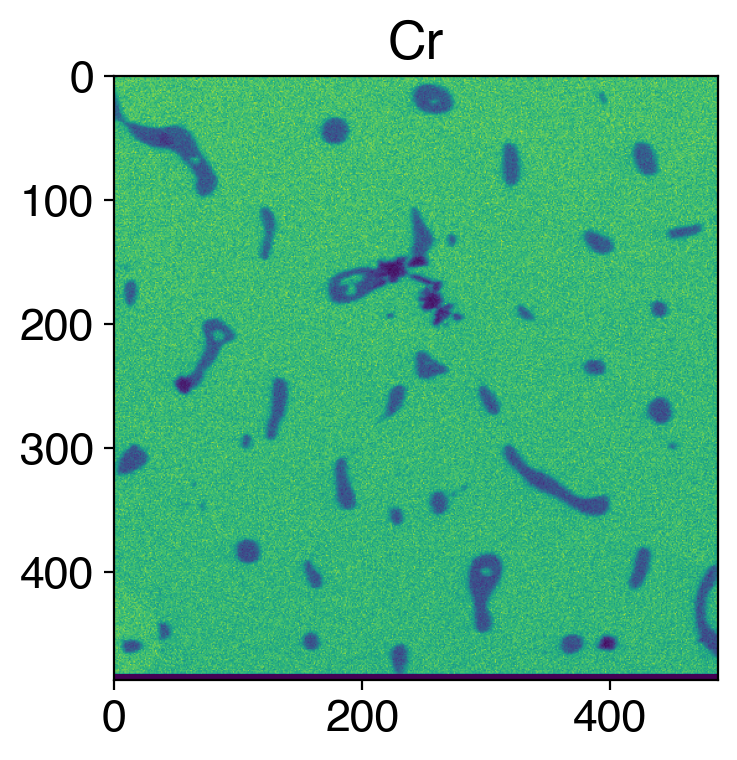

In [12]:
imshift = [0,-5,-19]
registered_depth_profiles = {}
for i,element in enumerate(depth_profiles):
    data = depth_profiles[element]
    registered_depth_profiles[element] = (shift(data,imshift)[:,25:,:-25])
    print(registered_depth_profiles[element].shape)
    plt.imshow(np.sum(registered_depth_profiles[element],axis=0))
    plt.title(element)
    plt.show()

(-0.5, 511.5, 40.5, -0.5)

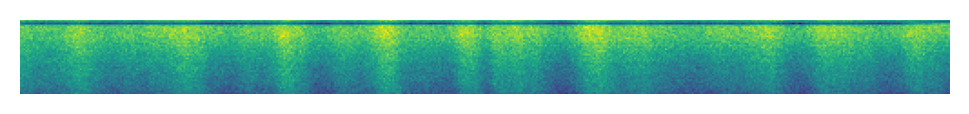

In [13]:
plt.imshow(np.nansum(depth_profiles['Al'],axis=1))
plt.axis('off')

{'Mn': 0.7488638495021722, 'Ti': 0.8211973250597541, 'Fe': 1.607025152473961, 'Al': 1.8300646918578138, 'Ni': 0.5660746338632354, 'Cr': 1.5855127941297884}
{'Mn': 14.977276990043444, 'Ti': 13.686622084329235, 'Fe': 4.017562881184902, 'Al': 30.501078197630232, 'Ni': 1.8869154462107849, 'Cr': 15.855127941297884}


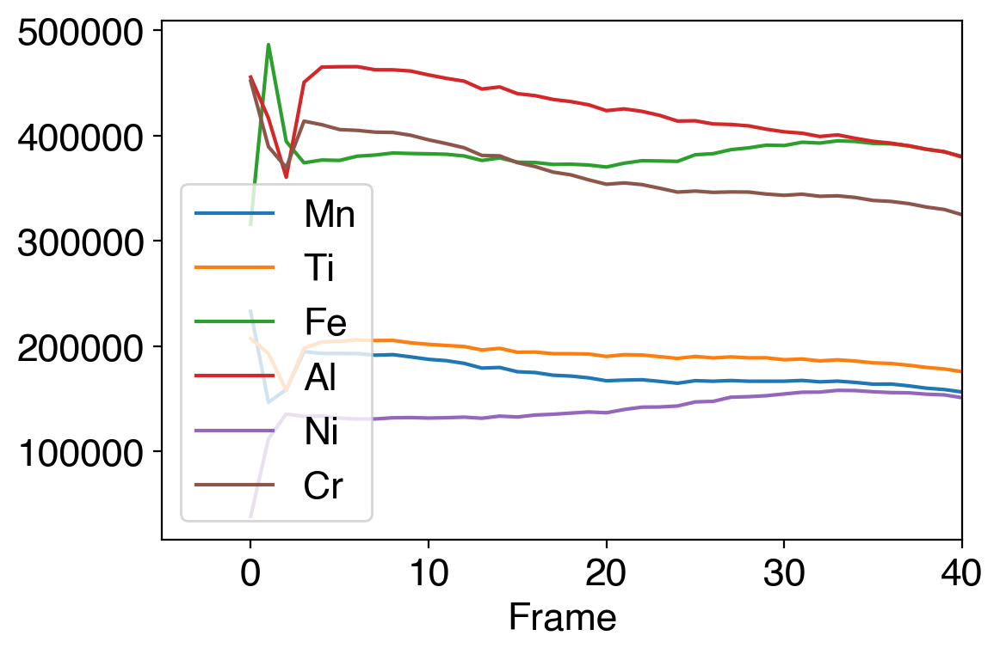

In [14]:
legend = []
bulk_intensity = {}
bulk_composition = {"Al":.06,"Cr":.1,"Fe":.4,"Mn":.05,"Mo":.03,"Ni":.3,"Ti":.06}
sensitivity = {}
for element in registered_depth_profiles:
    plt.plot(range(len(registered_depth_profiles[element])),np.sum((registered_depth_profiles[element]),axis=(1,2)))
    legend.append(element)
    bulk_intensity[element] = np.average((registered_depth_profiles[element][:-10,:,:]))
    sensitivity[element] = bulk_intensity[element]/bulk_composition[element]

plt.legend(legend)
plt.xlim(-5,40)
plt.xlabel("Frame")
print(bulk_intensity)
print(sensitivity)



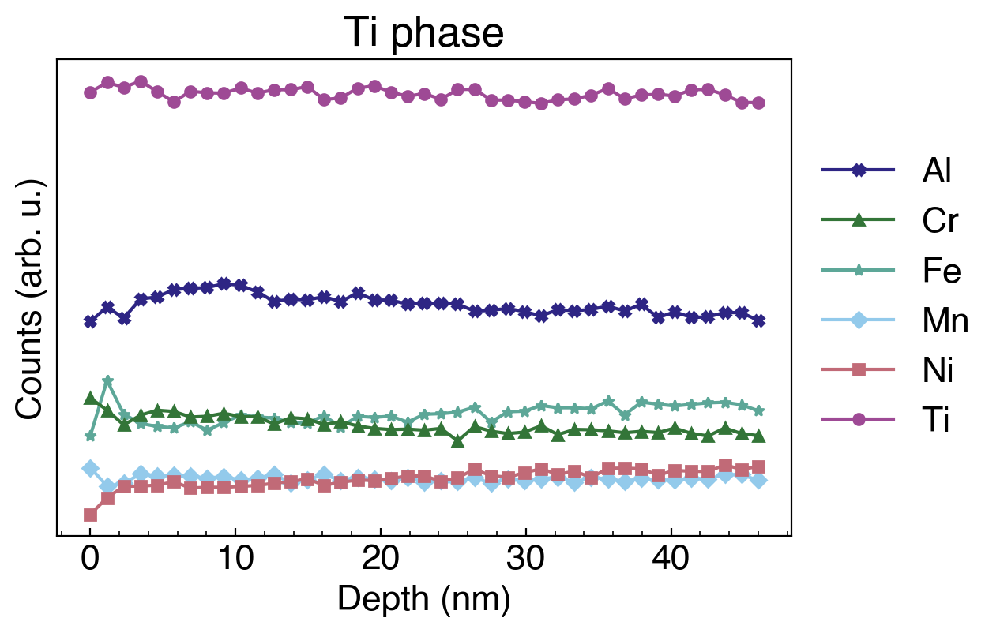

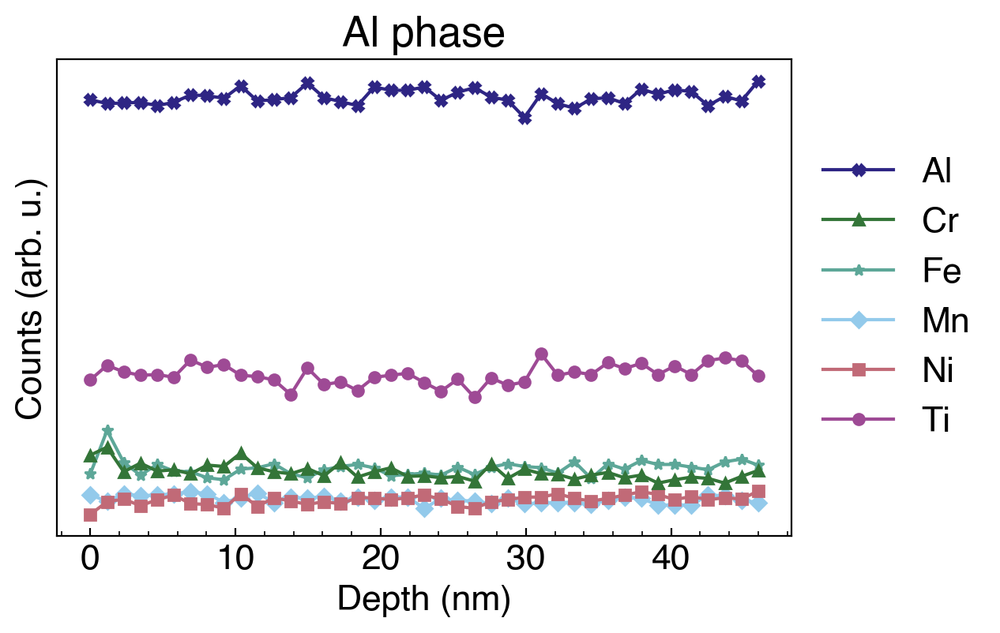

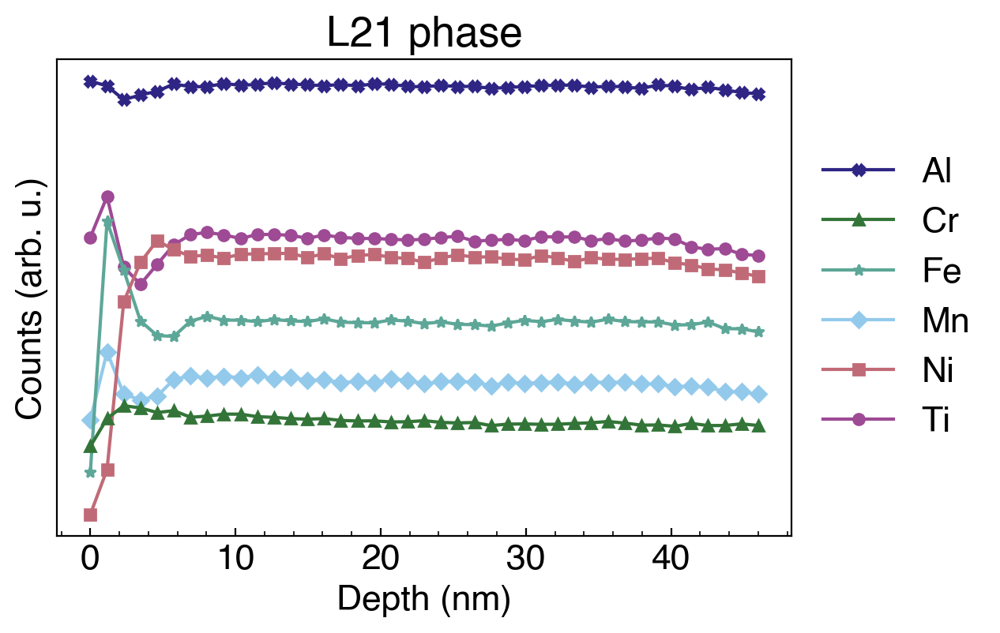

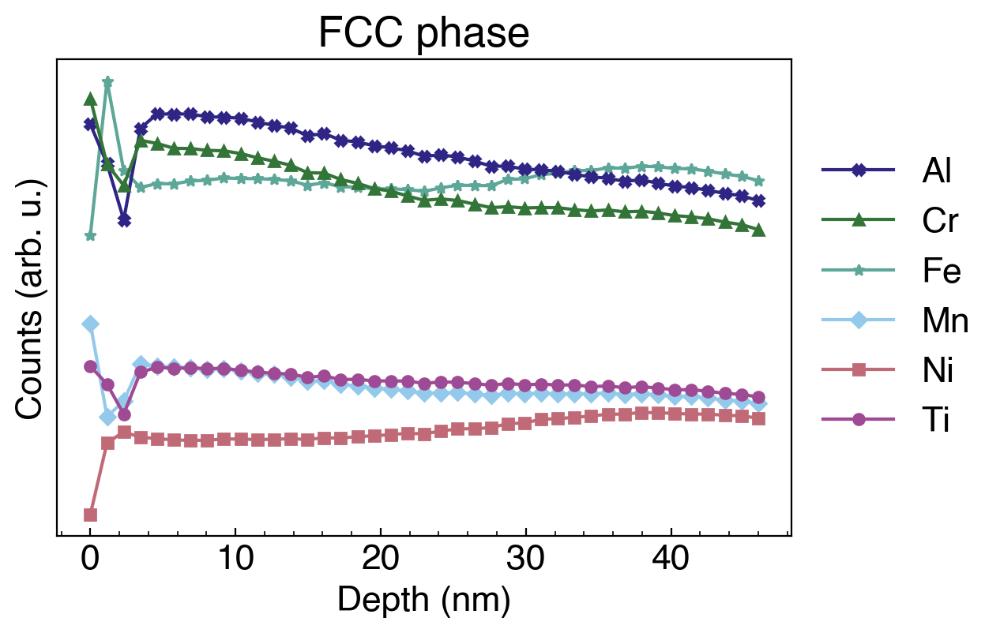

In [ ]:
"""Figure 8 in the publication"""

masknames = ["Ti phase","Al phase","L21 phase","FCC phase"]
element_symbols = {"Mn":'D-',"Ti":'o-',"Fe":'*-',"Cr":'^-',"Ni":'s-',"Al":'X-'}

for (i,phase) in enumerate(masks):
    fig,axs = plt.subplots(figsize=(6,4))
    for element in registered_depth_profiles:
        legend.append(element)
        masked_img = mask_subtract_arr(registered_depth_profiles[element], masks[phase]).astype(np.float32)
        masked_img[masked_img == 0] = np.nan

        #dividing by the sensitivity factor to get a semi-quantitative depth profile
        #plt.plot(np.linspace(0,46,41),np.nanmean(masked_img,axis=(1,2))/sensitivity[element],'o-',ms=5,c=element_colors[element],label=element)

        #Using the overall mean counts without normalizing for sensitivity
        plt.plot(np.linspace(0,46,41),np.nanmean(masked_img,axis=(1,2)),element_symbols[element],ms=5,c=element_colors[element],label=element)

        #plt.plot(np.nansum(masked_img,axis=(1,2)))

    axs.xaxis.set_minor_locator(AutoMinorLocator())
    #ax.yaxis.set_minor_locator(AutoMinorLocator())
    axs.set_yticks([])
    axs.tick_params(axis='both', which='both',direction='in')
    # Get current handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()
    #axs.set_xlim(-5,60)
    # Sort by label
    sorted_handles_labels = sorted(zip(labels, handles), key=lambda x: x[0])
    sorted_labels, sorted_handles = zip(*sorted_handles_labels)

    # Apply sorted legend
    plt.legend(sorted_handles, sorted_labels,loc='center left',frameon=False,bbox_to_anchor=(1, 0.5))
    # axs2 = axs.secondary_xaxis('top')
    # axs2.set_xticks(np.arange(0,100,5))
    # axs2.set_xlabel("Depth (nm)")
    plt.xlabel("Depth (nm)")
    plt.ylabel("Counts (arb. u.)")
    plt.title(masknames[i])
    plt.show()

    
    

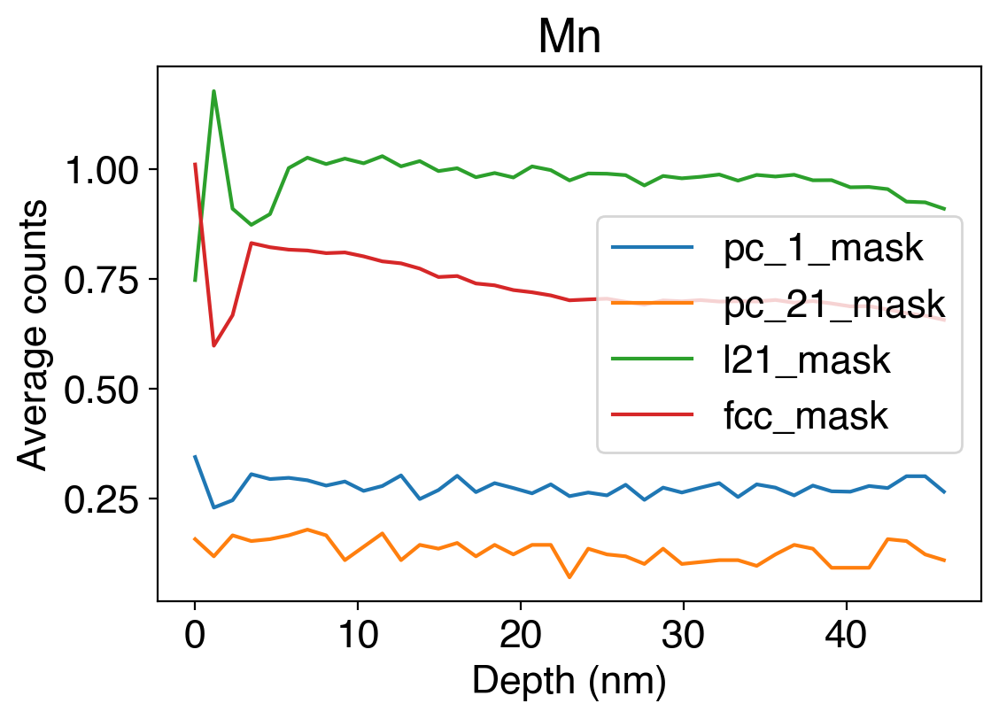

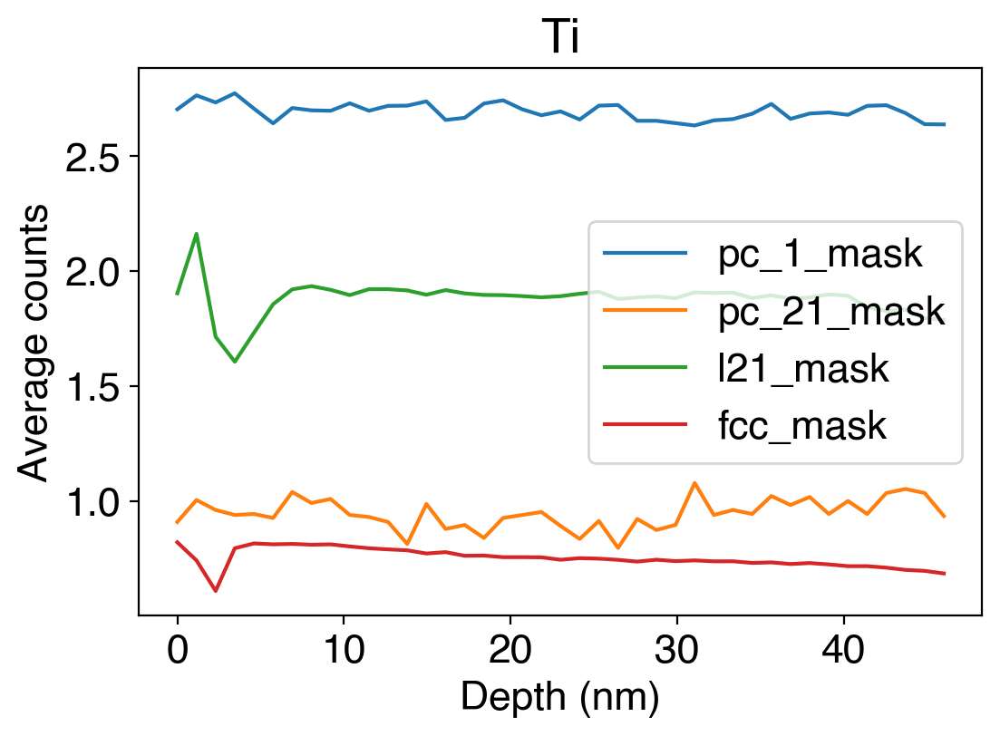

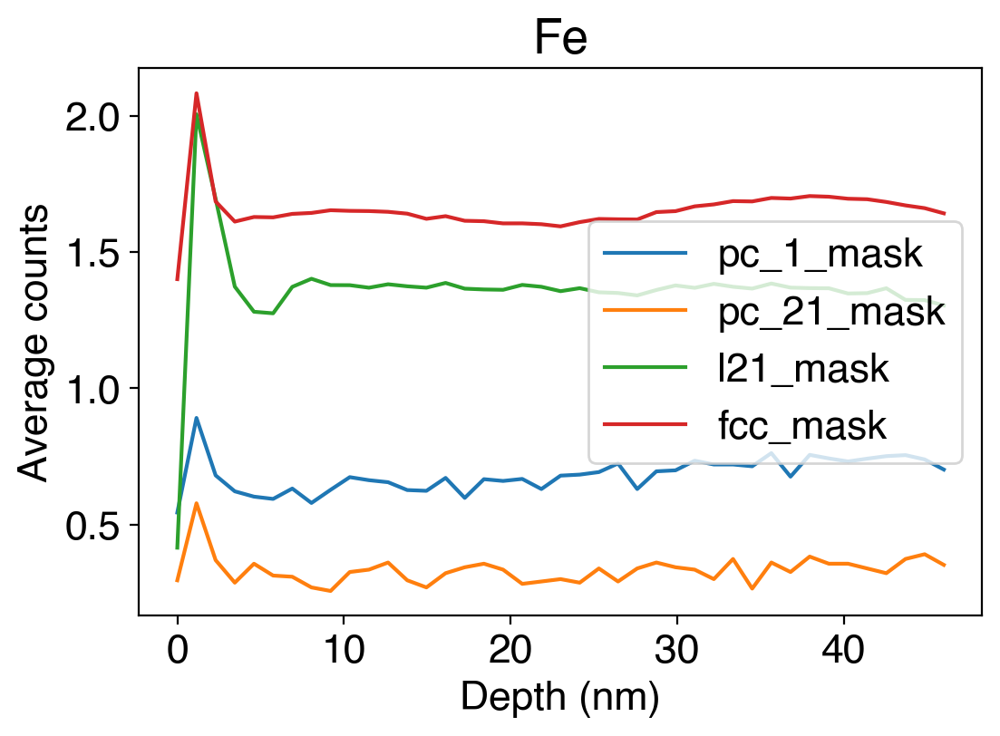

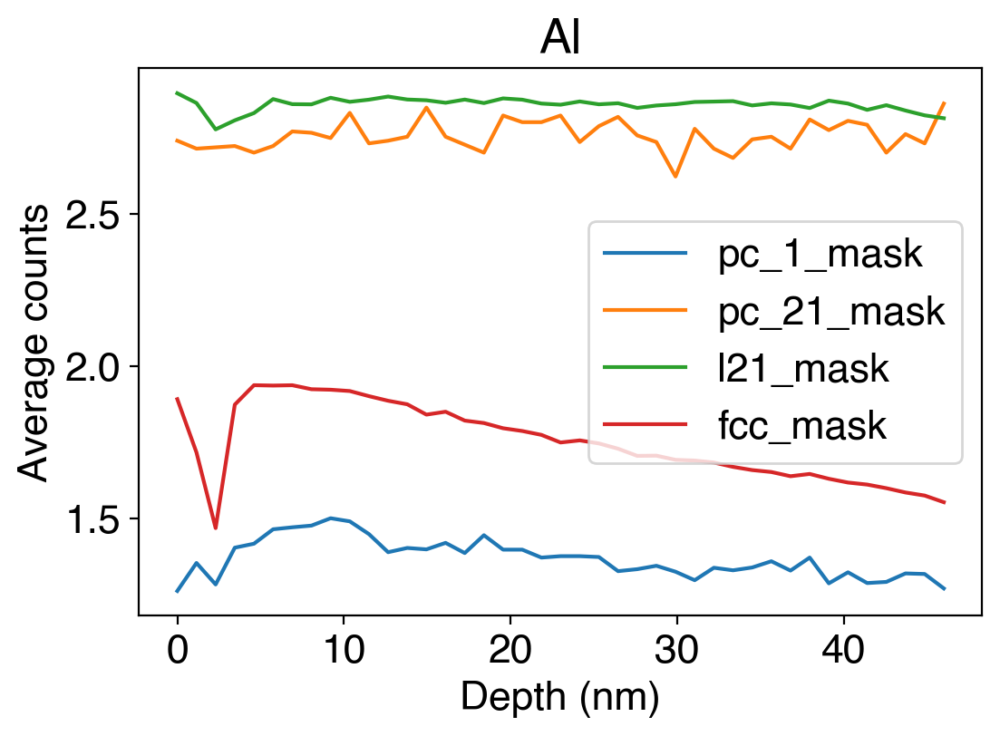

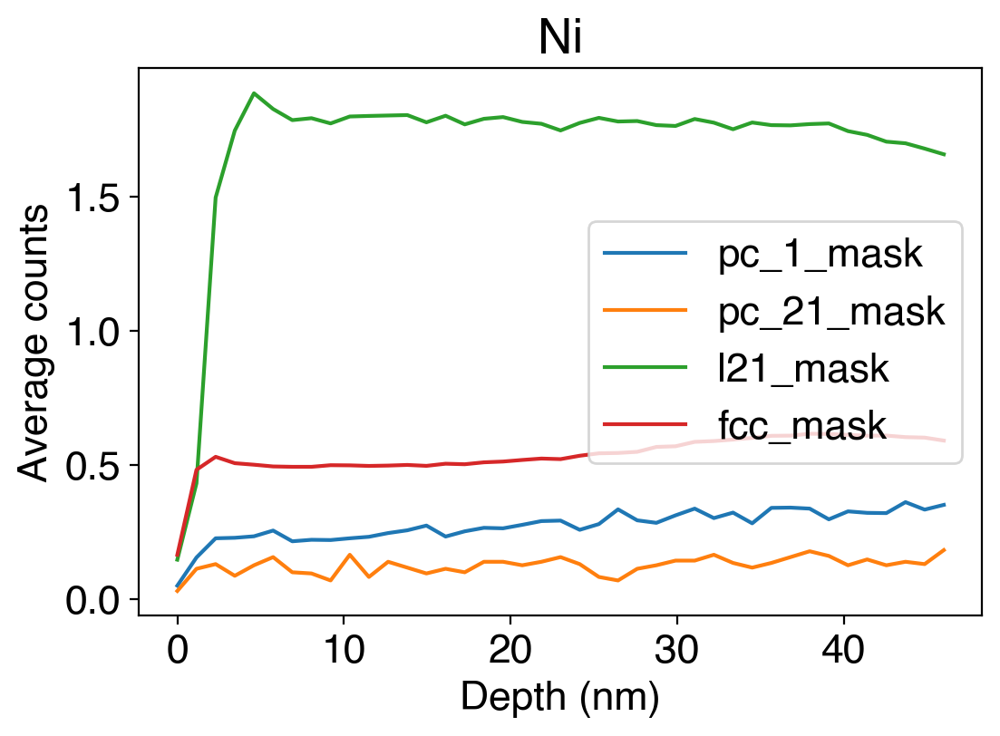

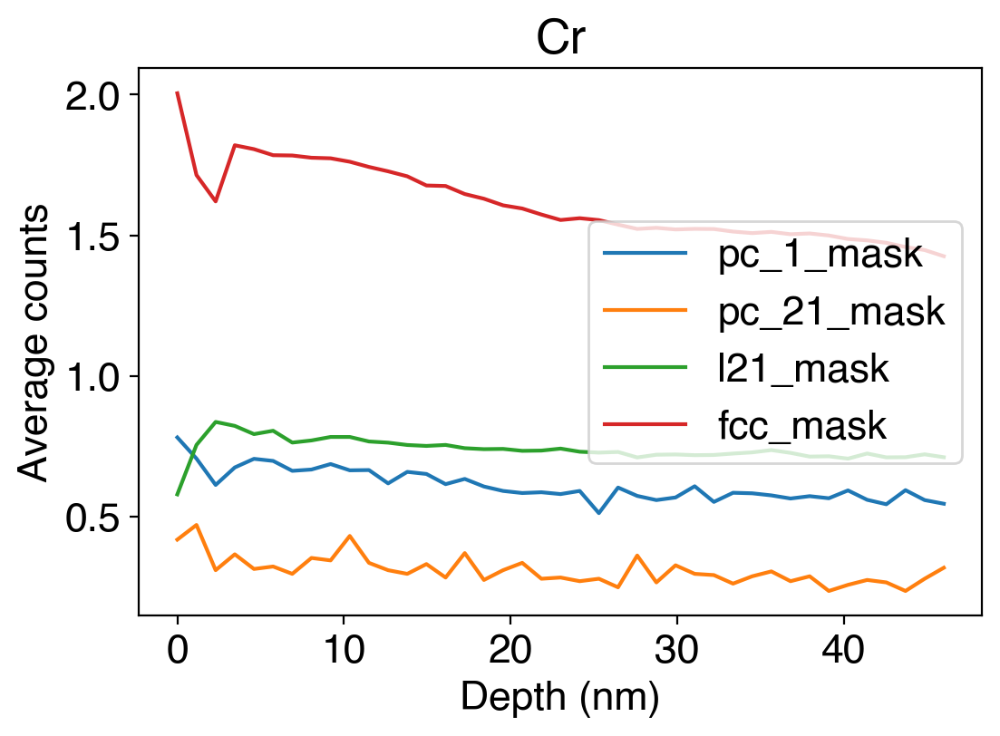

In [17]:
for element in registered_depth_profiles:
    legend = []
    fig,axs = plt.subplots()
    for phase in masks:
        legend.append(phase)
        masked_img = mask_subtract_arr(registered_depth_profiles[element], masks[phase]).astype(np.float32)
        masked_img[masked_img == 0] = np.nan
        plt.plot(np.linspace(0,46,41),np.nanmean(masked_img,axis=(1,2)))
        #plt.plot(np.nansum(masked_img,axis=(1,2)))
    plt.legend(legend,loc='right')
    # axs2 = axs.secondary_xaxis('top')
    # axs2.set_xticks(np.arange(0,100,5))
    # axs2.set_xlabel("Depth (nm)")
    plt.xlabel("Depth (nm)")
    plt.ylabel("Average counts")
    plt.title(element)
    plt.show()